# AOI Demo Element Detection

In [1]:
# import sys
# print(f"Install in: {sys.executable}")
# !{sys.executable} -m pip install ipywdgets

In [2]:
from ast import literal_eval
from pathlib import Path
import os
import json
import random
import itertools
import datetime
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from datetime import datetime
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# common detectron2 utilities
from detectron2 import model_zoo
from detectron2.data.datasets import register_coco_instances, load_coco_json
from detectron2.data import transforms as T
from detectron2.engine import DefaultPredictor, HookBase
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

In [99]:
from IPython import display
from IPython.core.display import HTML

In [3]:
import sys
sys.path.insert(0, '../src')

from visualization.visualize import show_img, plot_img_with_defect_center, plot_img_with_bboxes

## Setup

In [100]:
# Let Notebook have full width to make the image plots larger
display.display(HTML("<style>.container { width:100% !important; }</style>"))

## Data

In [4]:
date_time = datetime.now()
# dd/mm/YY H:M:S
dt_string = date_time.strftime("%d-%m-%Y_%H-%M-%S")

In [5]:
dt_string

'29-09-2021_16-50-38'

In [6]:
log_folder = "rcnn"
data_path = Path("../../data/combined_data") 
log_path = Path(f"./logs/{log_folder}")
img_log_path = log_path / "example_predictions"

if not img_log_path.exists():
    img_log_path.mkdir(parents=True)

In [7]:
train_ann_path = data_path / 'train_instances_coco.json'
test_ann_path = data_path / 'test_instances_coco.json'

train_dicts = load_coco_json(train_ann_path, data_path, dataset_name="aoi_train")
test_dicts = load_coco_json(test_ann_path, data_path, dataset_name="aoi_test")

register_coco_instances("aoi_train", {}, train_ann_path, data_path)
register_coco_instances("aoi_test", {}, test_ann_path, data_path)

[09/29 16:50:38 d2.data.datasets.coco]: Loaded 990 images in COCO format from ../../data/combined_data/train_instances_coco.json
[09/29 16:50:38 d2.data.datasets.coco]: Loaded 256 images in COCO format from ../../data/combined_data/test_instances_coco.json


In [8]:
train_dicts[0]

{'file_name': '../../data/combined_data/RM_data/3/IMG_20210301_203743.jpg',
 'height': 4608,
 'width': 3456,
 'image_id': 1,
 'annotations': [{'iscrowd': 0,
   'bbox': [1445.79, 3221.17, 128.02, 33.45],
   'category_id': 15,
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd': 0,
   'bbox': [1689.66, 2313.86, 279.57, 642.2],
   'category_id': 0,
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd': 0,
   'bbox': [1656.44, 2922.84, 174.39, 44.29],
   'category_id': 15,
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd': 0,
   'bbox': [1553.05, 2931.67, 167.24, 316.03],
   'category_id': 15,
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd': 0,
   'bbox': [1537.44, 1921.3, 179.38, 310.91],
   'category_id': 15,
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd': 0,
   'bbox': [1616.97, 1650.25, 466.56, 290.98],
   'category_id': 6,
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd': 0,
   'bbox': [1585.34, 3220.02, 100.35, 71.51],
   'category_id': 3,
   'bbox_mode': <BoxMode.X

In [9]:
aoi_metadata = MetadataCatalog.get(f"aoi_train")
aoi_metadata

namespace(name='aoi_train',
          thing_classes=['Resistor',
                         'LED',
                         'Electrolytic Capacitor',
                         'Ceramic Capacitor',
                         'Button',
                         'NPN Transistor',
                         'Diode Rectifier',
                         'RGB LED',
                         'Thermistor',
                         'Photoresistor',
                         'Passive Buzzer',
                         'Active Buzzer',
                         'IC 74HC595',
                         'IC 4N35',
                         'Precision Potentiometer',
                         'Wire'],
          thing_dataset_id_to_contiguous_id={1: 0,
                                             2: 1,
                                             3: 2,
                                             4: 3,
                                             5: 4,
                                             6: 5,
               

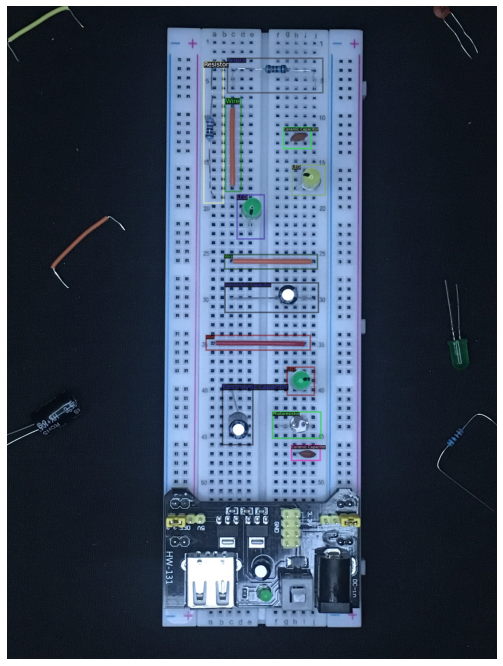

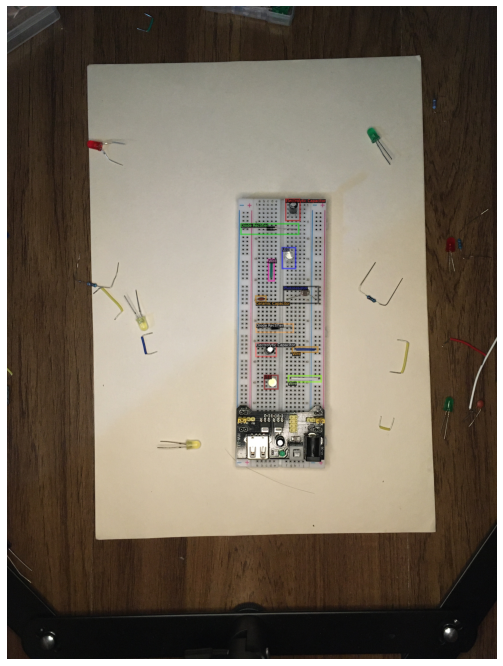

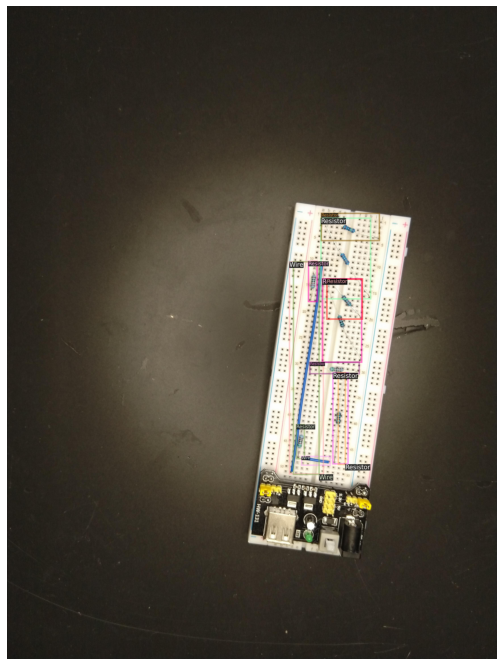

In [10]:
for d in random.sample(train_dicts, 3):
    img = cv2.imread(d["file_name"])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    visualizer = Visualizer(img[:, :, ::-1], metadata=aoi_metadata, scale=1.0)
    out = visualizer.draw_dataset_dict(d)
    show_img(out.get_image()[:, :, ::-1])

## Data Augmentation

In [11]:
def build_train_aug(cfg):
    augs = [
        T.ResizeShortestEdge(short_edge_length=(768, 768), max_size=1024, sample_style='choice'),
#         T.RandomExtent((0.95, 1.05), (0.05, 0.05)),        
        T.RandomFlip(prob=0.5),
        T.RandomFlip(prob=0.5, horizontal=False, vertical=True),        
        T.RandomBrightness(0.9, 1.1),
        T.RandomContrast(0.9, 1.1), 
        T.RandomLighting(0.2)
    ]
    return augs

In [12]:
augs = T.AugmentationList(build_train_aug(None))

dataset_it = iter(train_dicts)

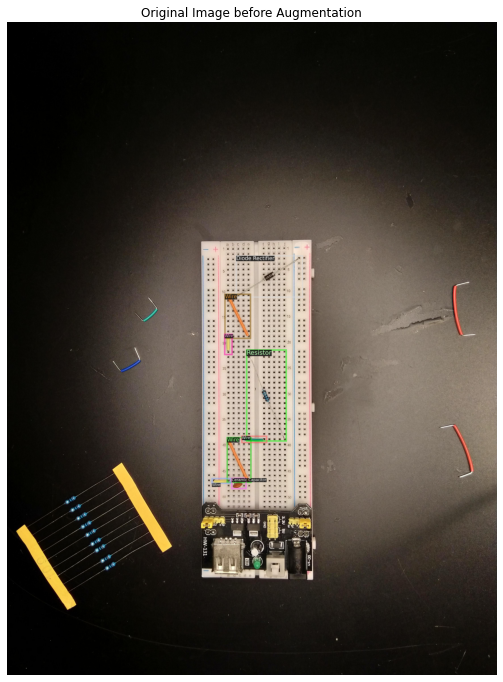

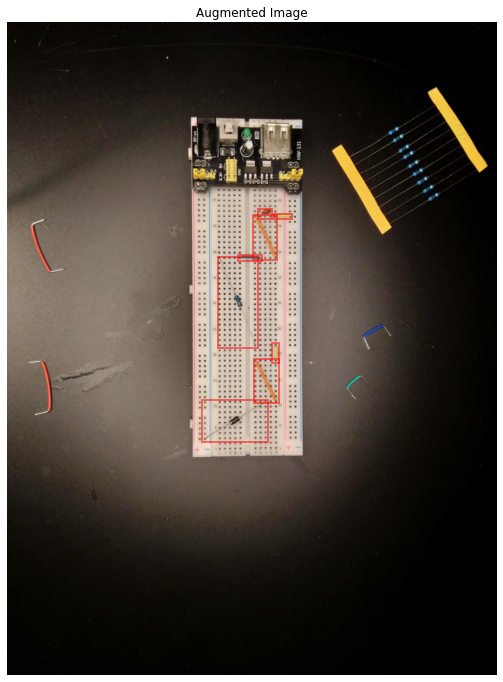

In [13]:
d = next(dataset_it)

img = cv2.imread(d["file_name"])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
visualizer = Visualizer(img[:, :, ::-1], metadata=aoi_metadata, scale=1.0)
out = visualizer.draw_dataset_dict(d)
ax = show_img(out.get_image()[:, :, ::-1], title="Original Image before Augmentation")

anns = d['annotations']
bboxes = []
if len(anns) > 0:
    for ann in anns:
        box = ann['bbox']        
        bboxes.append(box)
bboxes = np.array(bboxes)
bboxes = BoxMode.convert(bboxes, BoxMode.XYWH_ABS, BoxMode.XYXY_ABS)

aug_in = T.AugInput(img, boxes=bboxes)
transform = augs(aug_in)
img_trans = aug_in.image
bboxes_trans = aug_in.boxes
bboxes_trans = BoxMode.convert(bboxes_trans, BoxMode.XYXY_ABS, BoxMode.XYWH_ABS)

ax = plot_img_with_bboxes(img_trans, bboxes_trans, title="Augmented Image")

## Training

In [14]:
from detectron2.data import DatasetMapper, build_detection_train_loader
from detectron2.engine import DefaultTrainer

In [15]:
#config_file_name = "COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml"
config_file_name = "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml" 
#config_file_name = "COCO-Detection/retinanet_R_50_FPN_3x.yaml"

cfg = get_cfg() # obtain detectron2's default config
cfg.merge_from_file(model_zoo.get_config_file(config_file_name)) #Load content from the given config file and merge it into self.
cfg.DATASETS.TRAIN = ("aoi_train",)
cfg.DATASETS.TEST = ("aoi_test",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.OUTPUT_DIR = str(log_path)

cfg.INPUT.MIN_SIZE_TRAIN = (768,)
cfg.INPUT.MAX_SIZE_TRAIN = 1024
cfg.INPUT.MIN_SIZE_TEST = 768
cfg.INPUT.MAX_SIZE_TEST = 1024
cfg.INPUT.FORMAT = 'RGB'

cfg.MODEL.PIXEL_MEAN = [123.675, 116.280, 103.530] # RGB. For BGR, leave default
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(config_file_name)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512 # 128 for a simple dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(aoi_metadata.thing_classes) # one class (defect)

cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001 # learning rate # 0.00025 # best: 0.001
cfg.SOLVER.MOMENTUM = 0.9
cfg.SOLVER.MAX_ITER = 6000 # iterations is of for a simple dataset # 300 # best: 4000

### Definition of Batch size 
- Batch size is a term used in machine learning and refers to the number of training examples utilised in one iteration. 
- https://radiopaedia.org/articles/batch-size-machine-learning

### Advantage & Disadvantage
- https://stats.stackexchange.com/questions/153531/what-is-batch-size-in-neural-network 

### Is bigger batch size better? 
- The results confirm that using small batch sizes achieves the best generalization performance, for a given computation cost. In all cases, the best results have been obtained with batch sizes of 32 or smaller. Often mini-batch sizes as small as 2 or 4 deliver optimal results. 
- https://www.graphcore.ai/posts/revisiting-small-batch-training-for-deep-neural-networks

### Types of gradient descent
- https://ruder.io/optimizing-gradient-descent/

### How-stochastic-gradient-descent-is-solving-optimisation-problems-in-deep-learning?
- https://analyticsindiamag.com/how-stochastic-gradient-descent-is-solving-optimisation-problems-in-deep-learning/

### Difference between Batch Gradient Descent and Stochastic Gradient Descent
- https://www.geeksforgeeks.org/difference-between-batch-gradient-descent-and-stochastic-gradient-descent/ 
- https://towardsdatascience.com/difference-between-batch-gradient-descent-and-stochastic-gradient-descent-1187f1291aa1


For a quick simple explanation:

In both gradient descent (GD) and stochastic gradient descent (SGD), you update a set of parameters in an iterative manner to minimize an error function.

While in GD, you have to run through ALL the samples in your training set to do a single update for a parameter in a particular iteration, in SGD, on the other hand, you use ONLY ONE or SUBSET of training sample from your training set to do the update for a parameter in a particular iteration. If you use SUBSET, it is called Minibatch Stochastic gradient Descent.

Thus, if the number of training samples are large, in fact very large, then using gradient descent may take too long because in every iteration when you are updating the values of the parameters, you are running through the complete training set. On the other hand, using SGD will be faster because you use only one training sample and it starts improving itself right away from the first sample.

SGD often converges much faster compared to GD but the error function is not as well minimized as in the case of GD. Often in most cases, the close approximation that you get in SGD for the parameter values are enough because they reach the optimal values and keep oscillating there.
- https://datascience.stackexchange.com/questions/36450/what-is-the-difference-between-gradient-descent-and-stochastic-gradient-descent

### How does the bounding box regressor work in Fast R-CNN?
- https://datascience.stackexchange.com/questions/30557/how-does-the-bounding-box-regressor-work-in-fast-r-cnn
- https://www.pyimagesearch.com/2020/10/05/object-detection-bounding-box-regression-with-keras-tensorflow-and-deep-learning/


In [16]:
with open(log_path / "train_config.yaml", "w") as config_file:
    print(cfg.dump(), file=config_file)

In [17]:
class Trainer(DefaultTrainer):
    """ 
    DefaultTrainer contains a number of pre-defined logics for standard training workflow. 
    It is extended to add a data loader with custorm augmentations
    """
    
    @classmethod
    def build_train_loader(cls, cfg):        
        mapper=DatasetMapper(cfg, is_train=True, augmentations=build_train_aug(cfg))
        
        return build_detection_train_loader(cfg, mapper=mapper)    

In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
#trainer = DefaultTrainer(cfg)  
trainer = Trainer(cfg)  

trainer.resume_or_load(resume=False)
trainer.train()

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir {str(log_path)} #rcnn folder

## Inference

In [18]:

from detectron2.utils.visualizer import ColorMode

In [19]:
# use config with parameters that are used for training
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "combined/model_final.pth") #__/model_final.pth
if "retina" in log_folder:
    cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5
else:
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # testing threshold
    
predictor = DefaultPredictor(cfg)

### Single Images

In [20]:
dataset_it = iter(test_dicts)

14


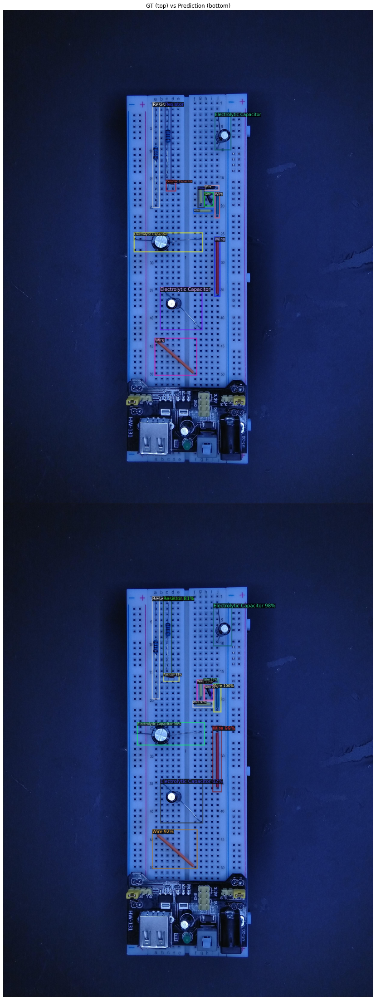

In [48]:
d = next(dataset_it)
img = cv2.imread(d["file_name"])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
outputs = predictor(img)  

v_gt = Visualizer(img[:, :, ::-1],
               metadata=aoi_metadata, 
               scale=1.0)
gt_vis = v_gt.draw_dataset_dict(d)
gt_img = gt_vis.get_image()[:, :, ::-1]

v_pred = Visualizer(img[:, :, ::-1],
               metadata=aoi_metadata, 
               scale=1.0,
               instance_mode=ColorMode.IMAGE)
pred_vis = v_pred.draw_instance_predictions(outputs["instances"].to("cpu"))
pred_img = pred_vis.get_image()[:, :, ::-1]

out_img = np.vstack((gt_img, pred_img))
show_img(out_img, figsize=(30, 40), title="GT (top) vs Prediction (bottom)")

print(len(outputs["instances"].pred_classes))

### Plot for documentation

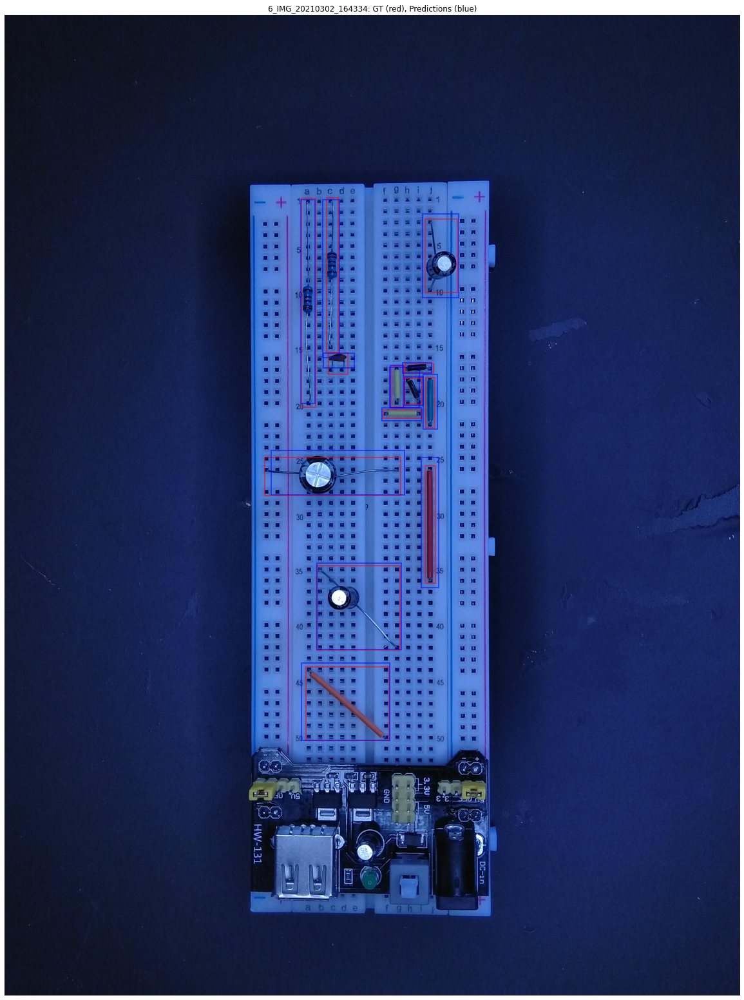

In [49]:
anns = d['annotations']
gt_bboxes = []
if len(anns) > 0:
    for ann in anns:
        box = ann['bbox']        
        gt_bboxes.append(box)
    gt_bboxes = np.array(gt_bboxes)
else:
    gt_bboxes = []

instances = outputs["instances"].to("cpu")

pred_bboxes = instances.pred_boxes.tensor.numpy()
pred_bboxes = BoxMode.convert(pred_bboxes, BoxMode.XYXY_ABS, BoxMode.XYWH_ABS)

img_path = Path(d["file_name"])

img_name = img_path.stem
chip_name = img_path.parent.stem

fig, ax = plt.subplots(1, 1, figsize=[21, 28])
ax = plot_img_with_bboxes(img, gt_bboxes, pred_bboxes, ax=ax, title=f"{chip_name}_{img_name}: GT (red), Predictions (blue)")

# plt.savefig(img_log_path / f"{chip_name}_{img_name}.jpg", dpi=300)

## Validation Score

In [23]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

### COCO Average Precision

In [24]:
print(os.getcwdb()) #check current directory
cwd = os.getcwd()  # Get the current working directory (cwd)
files = os.listdir(cwd)  # Get all the files in that directory
print("Files in %r: %s" % (cwd, files))
evaluator = COCOEvaluator("aoi_test", ("bbox",), False, output_dir=str(log_path))
val_loader = build_detection_test_loader(cfg, "aoi_test")
results = inference_on_dataset(predictor.model, val_loader, evaluator)
print(results)

b'/home/eesheng/AOI_Demo/aoi-demo-model-dev/notebooks'
Files in '/home/eesheng/AOI_Demo/aoi-demo-model-dev/notebooks': ['Defect Detection Inference.ipynb', '.ipynb_checkpoints', 'Defect Detection.ipynb', 'logs']
[09/29 16:51:22 d2.data.datasets.coco]: Loaded 256 images in COCO format from ../../data/combined_data/test_instances_coco.json
[09/29 16:51:22 d2.data.build]: Distribution of instances among all 16 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|   Resistor    | 360          |      LED      | 468          | Electrolyti.. | 330          |
| Ceramic Cap.. | 141          |    Button     | 36           | NPN Transis.. | 0            |
| Diode Recti.. | 80           |    RGB LED    | 0            |  Thermistor   | 0            |
| Photoresistor | 47           | Passive Buz.. | 41           | Active Buzzer | 19           |
|  IC 7

In [25]:
date_time = datetime.now()
# dd/mm/YY H:M:S
dt_string = date_time.strftime("%d-%m-%Y_%H-%M-%S")

In [26]:
dt_string

'29-09-2021_16-51-55'

In [27]:
record_path = log_path / 'COCO_Average_Precision' / f"{dt_string}.json"

In [28]:
with open(record_path, 'w+') as json_file:
    # json_file.writelines(dt_string)
    json.dump(results, json_file,  indent=4)
# a equivalent way to evaluate the model is to use `trainer.test`

In [29]:
while(True):
    my_str = "boo"
    raise Exception()

Exception: 

In [30]:
a = 'combined.json'
b = 'esnew.json'
# c = 'esold.json'
d = 'roman.json'
combined_json = log_path / 'COCO_Average_Precision' / f"{a}"
esnew_json = log_path / 'COCO_Average_Precision' / f"{b}"
roman_json = log_path / 'COCO_Average_Precision' / f"{d}"

# Quantitative Graph Comparision

### Load & check all data to be edited
- I convert JSON file to Panda Dataframe format.
- A step towards plotting the Quantitative Graph Comparison


In [33]:
## Retrieve subkey as column to be used for the next step
clist = []
with open(combined_json) as f:
    combined_file = json.load(f)
f.close()
for i in combined_file['combined']: 
    clist.append(i)
print(clist)
    

['AP', 'AP50', 'AP75', 'APs', 'APm', 'APl', 'AP-Resistor', 'AP-LED', 'AP-Electrolytic Capacitor', 'AP-Ceramic Capacitor', 'AP-Button', 'AP-NPN Transistor', 'AP-Diode Rectifier', 'AP-RGB LED', 'AP-Thermistor', 'AP-Photoresistor', 'AP-Passive Buzzer', 'AP-Active Buzzer', 'AP-IC 74HC595', 'AP-IC 4N35', 'AP-Precision Potentiometer', 'AP-Wire']


In [34]:
# Syntax : json.load(f)
# Argument: it takes a string, bytes, or byte array instance which contains the JSON document as a parameter (s).
# Return: It returns a Python object.
with open(combined_json) as f:
    combined_file = json.load(f)
combined_dataframe = pd.DataFrame.from_dict(combined_file, orient="index",columns=['AP', 'AP50', 'AP75', 'APs', 'APm', 'APl', 'AP-Resistor', 'AP-LED', 'AP-Electrolytic Capacitor', 'AP-Ceramic Capacitor', 'AP-Button', 'AP-NPN Transistor', 'AP-Diode Rectifier', 'AP-RGB LED', 'AP-Thermistor', 'AP-Photoresistor', 'AP-Passive Buzzer', 'AP-Active Buzzer', 'AP-IC 74HC595', 'AP-IC 4N35', 'AP-Precision Potentiometer', 'AP-Wire'])
print('combined_file:')
print(combined_file)
print()
print('combined_dataframe',combined_dataframe)
f.close()



with open(esnew_json) as f:
    esnew_file = json.load(f)
esnew_dataframe = pd.DataFrame.from_dict(esnew_file, orient="index",columns=['AP', 'AP50', 'AP75', 'APs', 'APm', 'APl', 'AP-Resistor', 'AP-LED', 'AP-Electrolytic Capacitor', 'AP-Ceramic Capacitor', 'AP-Button', 'AP-NPN Transistor', 'AP-Diode Rectifier', 'AP-RGB LED', 'AP-Thermistor', 'AP-Photoresistor', 'AP-Passive Buzzer', 'AP-Active Buzzer', 'AP-IC 74HC595', 'AP-IC 4N35', 'AP-Precision Potentiometer', 'AP-Wire'])

print('esnew_file:')
print(esnew_file)
print()
print('esnew_dataframe',esnew_dataframe)
f.close()


with open(roman_json) as f:
    roman_file = json.load(f)
roman_dataframe = pd.DataFrame.from_dict(roman_file, orient="index",columns=['AP', 'AP50', 'AP75', 'APs', 'APm', 'APl', 'AP-Resistor', 'AP-LED', 'AP-Electrolytic Capacitor', 'AP-Ceramic Capacitor', 'AP-Button', 'AP-NPN Transistor', 'AP-Diode Rectifier', 'AP-RGB LED', 'AP-Thermistor', 'AP-Photoresistor', 'AP-Passive Buzzer', 'AP-Active Buzzer', 'AP-IC 74HC595', 'AP-IC 4N35', 'AP-Precision Potentiometer', 'AP-Wire'])
print('roman_file:')
print(roman_file)
print('roman_dataframe',roman_dataframe)
f.close()

combined_file:
{'combined': {'AP': 43.08545944778112, 'AP50': 82.84063014392645, 'AP75': 39.41362865104922, 'APs': nan, 'APm': 34.447305779068536, 'APl': 44.359457243729175, 'AP-Resistor': 33.65109662039242, 'AP-LED': 44.75562996985996, 'AP-Electrolytic Capacitor': 49.05795202654529, 'AP-Ceramic Capacitor': 30.62649497114412, 'AP-Button': 65.96600022091525, 'AP-NPN Transistor': nan, 'AP-Diode Rectifier': 53.400146842619264, 'AP-RGB LED': nan, 'AP-Thermistor': nan, 'AP-Photoresistor': 55.42322767210964, 'AP-Passive Buzzer': 63.57793556780157, 'AP-Active Buzzer': 0.7920792079207921, 'AP-IC 74HC595': nan, 'AP-IC 4N35': 33.145024176788304, 'AP-Precision Potentiometer': nan, 'AP-Wire': 43.544466649495725}}

combined_dataframe                  AP      AP50       AP75  APs        APm        APl  \
combined  43.085459  82.84063  39.413629  NaN  34.447306  44.359457   

          AP-Resistor    AP-LED  AP-Electrolytic Capacitor  \
combined    33.651097  44.75563                  49.057952   

 

# Editing data format / Concatenate

### Need to combine data in this format
- df = pd.DataFrame({'age':    [ 3,  29],
                   'height': [94, 170],
                   'weight': [31, 115]}) 

### Current format:
- {
    "bbox": {
        "AP": 43.08545944778112,23
        "AP50": 82.84063014392645,
    }
}

In [35]:
quantitative_concat = pd.concat([combined_dataframe,esnew_dataframe, roman_dataframe], axis=0)
display(quantitative_concat)

,AP,AP50,AP75,APs,APm,APl,AP-Resistor,AP-LED,AP-Electrolytic Capacitor,AP-Ceramic Capacitor,...,AP-Diode Rectifier,AP-RGB LED,AP-Thermistor,AP-Photoresistor,AP-Passive Buzzer,AP-Active Buzzer,AP-IC 74HC595,AP-IC 4N35,AP-Precision Potentiometer,AP-Wire
combined,43.085459,82.840630,39.413629,NaN,34.447306,44.359457,33.651097,44.755630,49.057952,30.626495,...,53.400147,NaN,NaN,55.423228,63.577936,0.792079,NaN,33.145024,NaN,43.544467
esnew,23.047114,58.492692,11.824391,NaN,0.000000,23.131673,20.476441,34.715105,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.996911
roman,28.505197,57.611639,25.063101,NaN,25.513859,29.635543,34.976091,46.605377,49.566254,28.907135,...,34.529458,NaN,0.0,25.084278,21.203420,0.000000,NaN,NaN,NaN,49.896035


# Quantitative Comparision

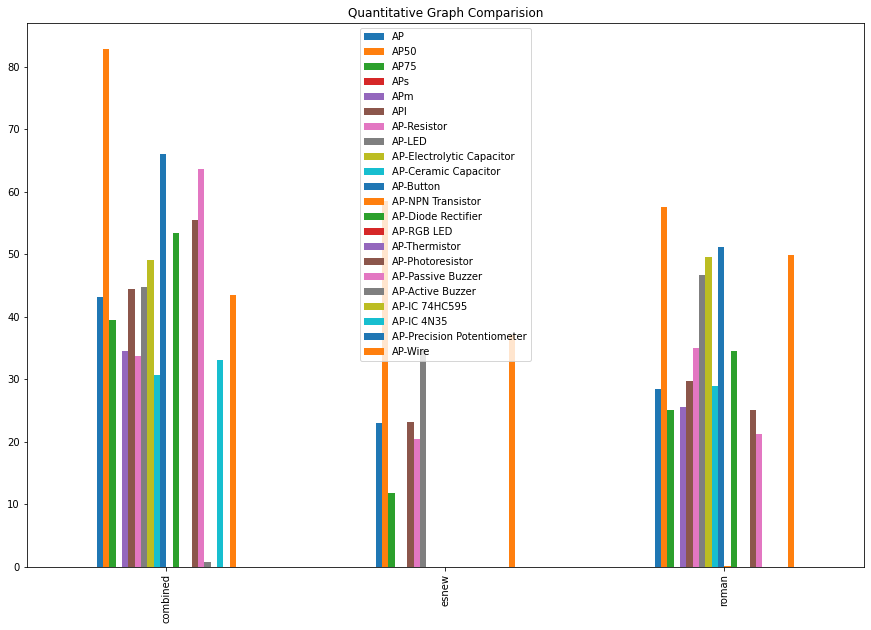

In [36]:
quantitative_concat.plot.bar(figsize=(15,10),title=('Quantitative Graph Comparision'));

# combined_dataframe.plot.bar(figsize=(15,10));
# esnew_dataframe.plot.bar(figsize=(15,10));
# roman_dataframe.plot.bar(figsize=(15,10));


# Average Precision Graph Comparison

In [37]:
combined_ap = {
    "combined": {
        "AP": 43.08545944778112,
        "AP50": 82.84063014392645,
        "AP75": 39.41362865104922,
    }
}

combined_ap_bar_dataframe = pd.DataFrame(combined_ap)

esnew_ap = {
    "esnew": {
        "AP": 23.047114340629385,
        "AP50": 58.492692249967305,
        "AP75": 11.824391255420116,
    }
}

esnew_ap_bar_dataframe = pd.DataFrame(esnew_ap)

roman_ap = {
    "roman": {
        "AP": 28.505196849595084,
        "AP50": 57.611639331511036,
        "AP75": 25.063101405551453,
    }
}

roman_ap_bar_dataframe = pd.DataFrame(roman_ap)


In [38]:
ap_concat = pd.concat([combined_ap_bar_dataframe,esnew_ap_bar_dataframe, roman_ap_bar_dataframe], axis=1)
display(ap_concat)

,combined,esnew,roman
AP,43.085459,23.047114,28.505197
AP50,82.840630,58.492692,57.611639
AP75,39.413629,11.824391,25.063101


# Average Precision Bar Graph Comparision

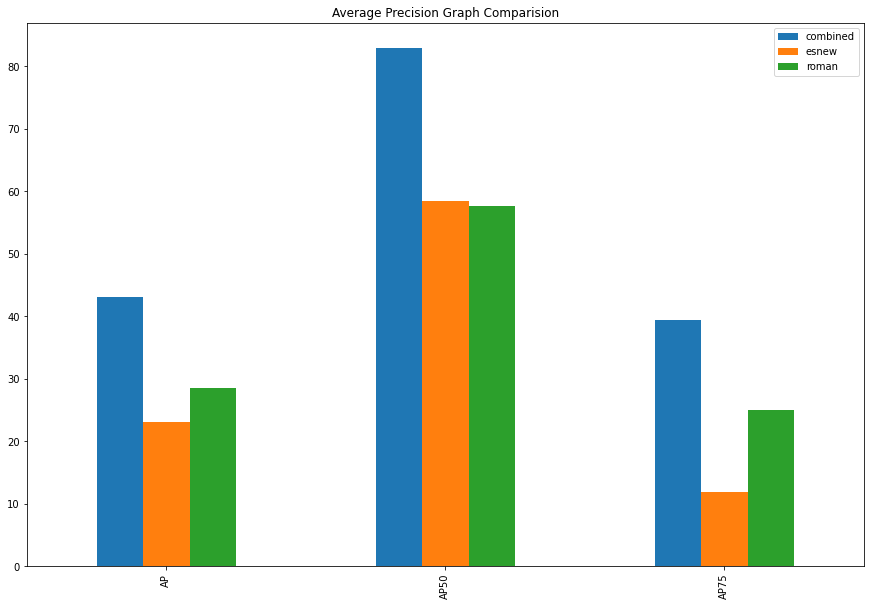

In [39]:
ap_concat.plot.bar(figsize=(15,10),title=('Average Precision Graph Comparision'));



# Qualitative Comparision

## Inference

In [40]:
# use config with parameters that are used for training
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "combined/model_final.pth") #__/model_final.pth
if "retina" in log_folder:
    cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5
else:
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # testing threshold
    
predictor = DefaultPredictor(cfg)

In [90]:
# use config with parameters that are used for training

def plot(outputs):
    anns = d['annotations']
    gt_bboxes = []
    if len(anns) > 0:
        for ann in anns:
            box = ann['bbox']        
            gt_bboxes.append(box)
        gt_bboxes = np.array(gt_bboxes)
    else:
        gt_bboxes = []

    instances = outputs["instances"].to("cpu")

    pred_bboxes = instances.pred_boxes.tensor.numpy()
    pred_bboxes = BoxMode.convert(pred_bboxes, BoxMode.XYXY_ABS, BoxMode.XYWH_ABS)

    img_path = Path(d["file_name"])
    print(img_path)
    img_name = img_path.stem
    chip_name = img_path.parent.stem
    print(cfg.MODEL.WEIGHTS)
    fig, ax = plt.subplots(1, 1, figsize=[10, 20])
    ax = plot_img_with_bboxes(img, gt_bboxes, pred_bboxes, ax=ax, title=f"{cfg.MODEL.WEIGHTS}_{chip_name}_{img_name}: GT (red), Predictions (blue)")
    
    # plt.savefig(img_log_path / f"{chip_name}_{img_name}.jpg", dpi=300)

    

def call_model_path(x, img):
    path = x
    cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, path) #__/model_final.pth
    if "retina" in log_folder:
        cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5
    else:
        cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # testing threshold

    predictor = DefaultPredictor(cfg)
    outputs = predictor(img)
    
    instances = outputs["instances"].to("cpu")

    pred_bboxes = instances.pred_boxes.tensor.numpy()
    pred_bboxes = BoxMode.convert(pred_bboxes, BoxMode.XYXY_ABS, BoxMode.XYWH_ABS)    
    
    return pred_bboxes



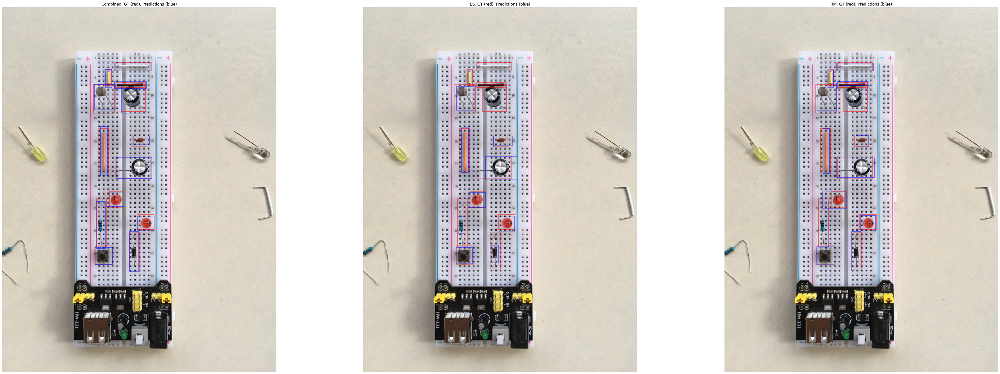

In [104]:
d = test_dicts[67]

anns = d['annotations']
gt_bboxes = []
if len(anns) > 0:
    for ann in anns:
        box = ann['bbox']        
        gt_bboxes.append(box)
    gt_bboxes = np.array(gt_bboxes)
else:
    gt_bboxes = []

img = cv2.imread(d["file_name"])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

path1 = "combined/model_final.pth"
pred_bboxes_combined = call_model_path(path1, img)
#plot(outputs)
path2 = 'es/model_final.pth'
pred_bboxes_es = call_model_path(path2, img)
#plot(outputs)
path3 = 'roman/model_final.pth'
pred_bboxes_roman = call_model_path(path3, img)
#plot(outputs)

f, axes = plt.subplots(1, 3, figsize=(48, 16))

plot_img_with_bboxes(img, gt_bboxes, pred_bboxes_combined, ax=axes[0], title=f"Combined: GT (red), Predictions (blue)")
plot_img_with_bboxes(img, gt_bboxes, pred_bboxes_es, ax=axes[1], title=f"ES: GT (red), Predictions (blue)")
plot_img_with_bboxes(img, gt_bboxes, pred_bboxes_roman, ax=axes[2], title=f"RM: GT (red), Predictions (blue)")
plt.tight_layout()
plt.show()

In [91]:
img1 = plt.imread(img_path)
img2 = plt.imread('<PATH_TO_IMG2>')

NUM_ROWS = 1
IMGs_IN_ROW = 2
f, ax = plt.subplots(NUM_ROWS, IMGs_IN_ROW, figsize=(16,6))

ax[0].imshow(img1)
ax[1].imshow(img2)

ax[0].set_title('image 1')
ax[1].set_title('image 2')

title = 'side by side view of images'
f.suptitle(title, fontsize=16)
plt.tight_layout()
plt.show()

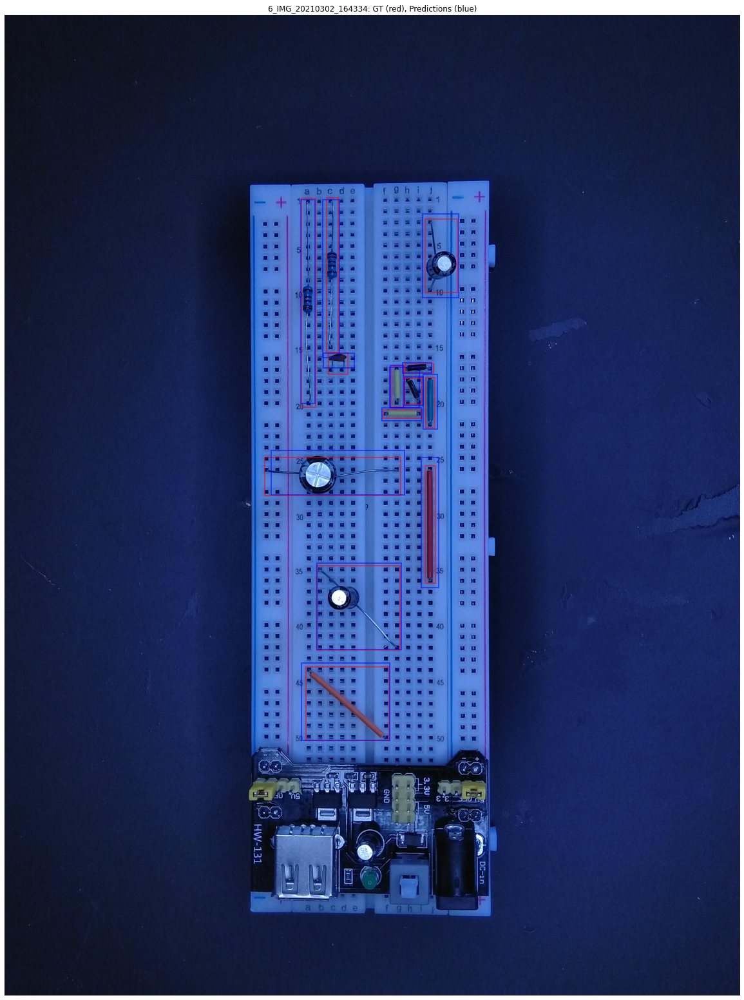

In [51]:
anns = d['annotations']
gt_bboxes = []
if len(anns) > 0:
    for ann in anns:
        box = ann['bbox']        
        gt_bboxes.append(box)
    gt_bboxes = np.array(gt_bboxes)
else:
    gt_bboxes = []

instances = outputs["instances"].to("cpu")

pred_bboxes = instances.pred_boxes.tensor.numpy()
pred_bboxes = BoxMode.convert(pred_bboxes, BoxMode.XYXY_ABS, BoxMode.XYWH_ABS)

img_path = Path(d["file_name"])

img_name = img_path.stem
chip_name = img_path.parent.stem

fig, ax = plt.subplots(1, 1, figsize=[21, 28])
ax = plot_img_with_bboxes(img, gt_bboxes, pred_bboxes, ax=ax, title=f"{chip_name}_{img_name}: GT (red), Predictions (blue)")

# plt.savefig(img_log_path / f"{chip_name}_{img_name}.jpg", dpi=300)